# Final Project - Deep Learning - selecting 30 photos

## stage 1 - find the best 30 images for training
  the idea is to use auto encoder, train all the 300 images, and to find the 30 most close to the average by the smallest representation of the encodoer.

In [ ]:
## installing - download the images
!pip install -q kaggle

In [ ]:
import gdown
url = "https://drive.google.com/u/1/uc?id=1zLZ02VuZu3njqsYf0-tWOJU-uOGVfiBz&export=download"
output = "kaggle.json"
gdown.download(url, output)

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"giladaharoni","key":"496cbabb7a3d649f646d2ea0dc99d613"}'}

In [ ]:
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json
! kaggle datasets list

ref                                                        title                                       size  lastUpdated          downloadCount  voteCount  usabilityRating  
---------------------------------------------------------  -----------------------------------------  -----  -------------------  -------------  ---------  ---------------  
themrityunjaypathak/covid-cases-and-deaths-worldwide       Covid Cases and Deaths WorldWide             8KB  2023-02-01 12:22:51           4215        110  1.0              
datascientistanna/customers-dataset                        Shop Customer Data                          23KB  2023-02-07 18:42:21           3094         88  1.0              
rajugc/imdb-top-250-movies-dataset                         IMDB Top 250 Movies Dataset                 52KB  2023-02-11 16:02:01           1215         40  1.0              
ahsan81/hotel-reservations-classification-dataset          Hotel Reservations Dataset                 480KB  2023-01-04 12:50:31  

In [ ]:
!kaggle competitions download -c gan-getting-started

 93% 341M/367M [00:02<00:00, 182MB/s]
100% 367M/367M [00:02<00:00, 138MB/s]


In [ ]:
! mkdir train
! unzip -qq gan-getting-started.zip -d train


Streaming output truncated to the last 5000 lines.
  inflating: train/photo_jpg/46e84039a1.jpg  
  inflating: train/photo_jpg/46f391abec.jpg  
  inflating: train/photo_jpg/46f5ef1042.jpg  
  inflating: train/photo_jpg/4706619607.jpg  
  inflating: train/photo_jpg/4707b03a08.jpg  
  inflating: train/photo_jpg/47100a9939.jpg  
  inflating: train/photo_jpg/471f4755b9.jpg  
  inflating: train/photo_jpg/472b351bc4.jpg  
  inflating: train/photo_jpg/472d5ac100.jpg  
  inflating: train/photo_jpg/4758e5dd4c.jpg  
  inflating: train/photo_jpg/4762bb79ef.jpg  
  inflating: train/photo_jpg/4778b13518.jpg  
  inflating: train/photo_jpg/4787b82d37.jpg  
  inflating: train/photo_jpg/478e07feaa.jpg  
  inflating: train/photo_jpg/478eb12a82.jpg  
  inflating: train/photo_jpg/479698b371.jpg  
  inflating: train/photo_jpg/4796d67f61.jpg  
  inflating: train/photo_jpg/47aad493bd.jpg  
  inflating: train/photo_jpg/47ae0edd23.jpg  
  inflating: train/photo_jpg/47b94957ff.jpg  
  inflating: train/photo_jpg/

In [ ]:
import torch
import numpy as np
from torchvision import datasets, transforms
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras


In [ ]:
my_dir = "./train/monet_tfrec"
myfiles = tf.data.Dataset.list_files(my_dir + "/*.tfrec")
dataset = tf.data.TFRecordDataset(myfiles)

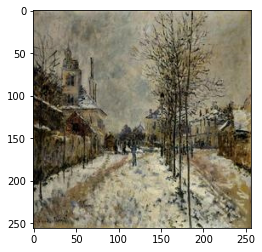

In [ ]:
from numpy.ma.core import shape
def parse_tfrecord(example):
    feature_description = {
        "image": tf.io.FixedLenFeature([], tf.string)
    }
    example = tf.io.parse_single_example(example, feature_description)
    image = tf.image.decode_jpeg(example["image"],channels=3)
    image = tf.image.resize(image, [256, 256])
    image = tf.cast(image, tf.float32) / 255.0
    return image,image

dataset = dataset.map(parse_tfrecord)
image = next(iter(dataset.take(1)))

# Display the image using matplotlib
plt.imshow(image[0])
plt.show()

after importing the data, let's build auto encoder

In [ ]:
from torch import nn, optim
import torch.nn.functional as F
from keras import layers, losses

In [ ]:
model = tf.keras.Sequential([
    # Apply a series of convolutional and pooling layers to reduce the spatial dimensions
    tf.keras.layers.Conv2D(16, 3, activation='relu',input_shape=(256,256,3)),
    tf.keras.layers.Conv2D(16, 3, activation='relu'),
    tf.keras.layers.MaxPooling2D(),
    tf.keras.layers.Conv2D(32, 3, activation='relu',strides=2),
    tf.keras.layers.Conv2D(32, 3, activation='relu'),
    tf.keras.layers.MaxPooling2D(),
    tf.keras.layers.Conv2D(64, 3, activation='relu',strides=3),
    tf.keras.layers.Conv2D(64, 3, activation='relu'),
    tf.keras.layers.MaxPooling2D(),
    
    # Flatten the output of the last convolutional layer to produce a vector - output of 1024
    tf.keras.layers.Conv2DTranspose(64, 3, strides=2, padding='same', activation='relu'),
    tf.keras.layers.Conv2DTranspose(64, 3, strides=2, padding='same', activation='relu'),
    tf.keras.layers.Conv2DTranspose(32, 3, strides=2, padding='same', activation='sigmoid'),
    tf.keras.layers.Conv2DTranspose(32, 3, strides=2, padding='same', activation='relu'),
    tf.keras.layers.Conv2DTranspose(32, 3, strides=2, padding='same', activation='relu'),
    tf.keras.layers.Conv2DTranspose(32, 3,strides=2, padding='same', activation='relu'),
    tf.keras.layers.Conv2DTranspose(3, 3, padding='same', activation='sigmoid')
])
model.summary()


Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_24 (Conv2D)          (None, 254, 254, 16)      448       
                                                                 
 conv2d_25 (Conv2D)          (None, 252, 252, 16)      2320      
                                                                 
 max_pooling2d_12 (MaxPoolin  (None, 126, 126, 16)     0         
 g2D)                                                            
                                                                 
 conv2d_26 (Conv2D)          (None, 62, 62, 32)        4640      
                                                                 
 conv2d_27 (Conv2D)          (None, 60, 60, 32)        9248      
                                                                 
 max_pooling2d_13 (MaxPoolin  (None, 30, 30, 32)       0         
 g2D)                                                 

we compiled the model with adam optimizer and binary cross entropy loss.

In [ ]:
model.compile(optimizer='adam', loss=losses.binary_crossentropy)

In [ ]:
dataBatch = dataset.batch(1)

In [ ]:
img = next(dat)

In [ ]:
model.fit(dataBatch,epochs=30,batch_size=1)

Epoch 1/30
300/300 [==============================] - 3s 11ms/step - loss: 0.6228
Epoch 2/30
300/300 [==============================] - 3s 11ms/step - loss: 0.6222
Epoch 3/30
300/300 [==============================] - 3s 11ms/step - loss: 0.6221
Epoch 4/30
300/300 [==============================] - 3s 10ms/step - loss: 0.6214
Epoch 5/30
300/300 [==============================] - 3s 10ms/step - loss: 0.6213
Epoch 6/30
300/300 [==============================] - 3s 12ms/step - loss: 0.6209
Epoch 7/30
300/300 [==============================] - 3s 10ms/step - loss: 0.6210
Epoch 8/30
300/300 [==============================] - 3s 10ms/step - loss: 0.6210
Epoch 9/30
300/300 [==============================] - 3s 11ms/step - loss: 0.6212
Epoch 10/30
300/300 [==============================] - 3s 10ms/step - loss: 0.6215
Epoch 11/30
300/300 [==============================] - 3s 10ms/step - loss: 0.6204
Epoch 12/30
300/300 [==============================] - 3s 11ms/step - loss: 0.6202
Epoch 13/30
3

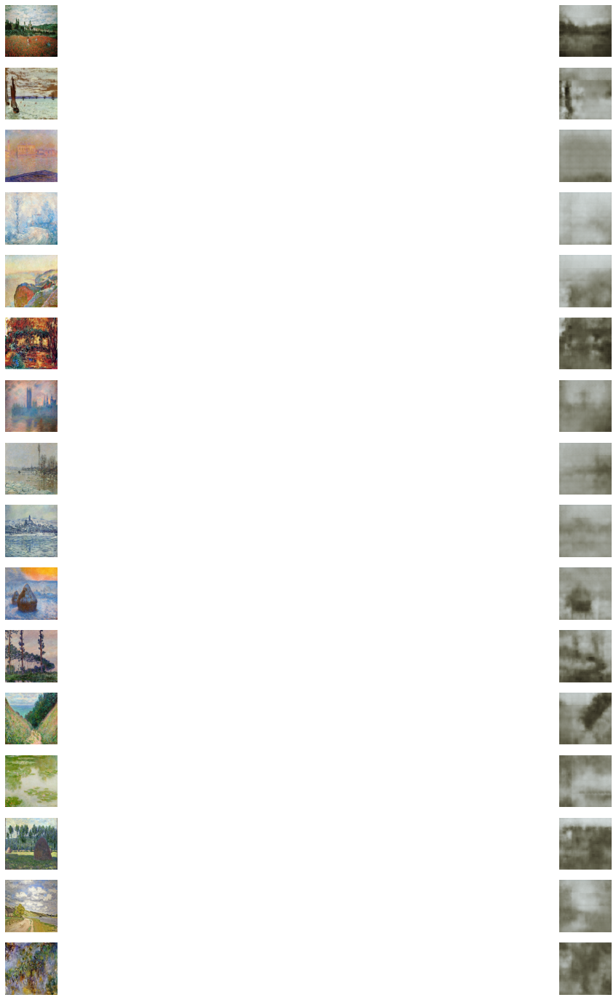

In [ ]:
image_iter = iter(dataBatch.take(16))
#plt.imshow(image_before[0][0])
# plt.imshow(image_after[0])
# plt.show()
fig, axes = plt.subplots(nrows=16, ncols=2,figsize=(25,25))
for i in range(0,16):
  image_before = next(image_iter)
  axes[i,0].imshow(image_before[0][0])
  axes[i,0].axis('off')
  image_after = model(image_before[0])
  axes[i,1].imshow(image_after[0])
  axes[i,1].axis('off')
plt.show()

#Stage 2 - find the average

defining reducer function that transform an image to the embedding layer output in the suto encoder.

In [ ]:
def reducer(sample,sample1):
  result = model.layers[6](model.layers[5](model.layers[4](model.layers[3](model.layers[2](model.layers[1](model.layers[0](sample)))))))
  result = model.layers[8](model.layers[7](result))
  result = tf.reshape(result,[-1])
  return result,sample1

In [ ]:
t=reducer(*image_before)


In [ ]:
reduced_Data = dataset.batch(1).map(reducer)

In [ ]:
array_np =[]
for element,_ in reduced_Data:
   array_np.append(element.numpy())

In [ ]:
array_t = np.array(array_np)

computing the mean vector of the transformed data.

In [ ]:
meany = array_t.mean(axis=0)

measure the distance bewteen each instance to the mean by L2^2 metric (dot product)

In [ ]:
lesa = [np.dot(meany,elem) for elem in array_np]

In [ ]:
tesa = []
for i in range(300):
  tesa.append([lesa[i],i])

sort the list by the dot product.

In [ ]:
zeva = sorted(tesa,key=lambda x:x[0])

pick the top-30 images.

In [ ]:
seleceted = []
for i in range(30):
  seleceted.append(zeva[i][1])

here are the images.

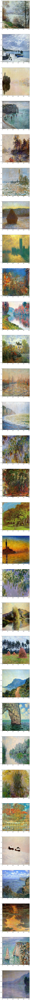

In [ ]:
fig, axes = plt.subplots(nrows=30, ncols=1,figsize=(256,256))
i=0
k=0
for _,image in reduced_Data:
  if i in seleceted:
    axes[k].imshow(image[0])
    k+=1
  i+=1